# Chord recognition

See [ELEN E4896 Music Signal Processing](https://www.ee.columbia.edu/~dpwe/e4896/practicals.html#prac10)

2016-04-03 Dan Ellis dpwe@ee.columbia.edu

In [2]:
%pylab inline
from __future__ import print_function
import pickle
import os
import IPython

import numpy as np
import scipy
import sklearn.mixture


Populating the interactive namespace from numpy and matplotlib


In [2]:
# Path to the place where the beatchromlab.zip data was unpacked.
DATA_DIR = '/Users/dpwe/Downloads/prac10/data'

In [3]:
# Read in the list of training file IDs.
def read_file_list(filename):
    """Read a text file with one item per line."""
    items = []
    with open(filename, 'r') as f:
        for line in f:
            items.append(line.strip())
    return items

train_list_filename = os.path.join(DATA_DIR, 'trainfilelist.txt')
train_ids = read_file_list(train_list_filename)
test_list_filename = os.path.join(DATA_DIR, 'testfilelist.txt')
test_ids = read_file_list(test_list_filename)

print(len(train_ids), "train file IDs and", len(test_ids), "test file IDs read.")
print("Example file ID:", train_ids[134])


141 train file IDs and 39 test file IDs read.
Example file ID: beatles/Let_It_Be/06-Let_It_Be


In [4]:
def read_beat_chroma_labels(file_id):
    """Read back a precomputed beat-synchronous chroma record."""
    filename = os.path.join(os.path.join(DATA_DIR, 'beatchromlabs', file_id + '.pkl'))
    with open(filename, "rb") as f:
        beat_times, chroma_features, label_indices = pickle.load(f)
    #chroma_features = chroma_features**0.25
    chroma_features /= np.maximum(0.01, np.max(chroma_features, axis=1))[:, np.newaxis]
    return beat_times, chroma_features, label_indices

file_id = train_ids[134]
beat_times, chroma_features, label_indices = read_beat_chroma_labels(file_id)
print(beat_times.shape, chroma_features.shape, label_indices.shape)

(550,) (550, 12) (550,)


In [5]:
def my_imshow(data, **kwargs):
    """Wrapper for imshow that sets common defaults."""
    plt.imshow(data, interpolation='nearest', aspect='auto', 
               origin='bottom', cmap='gray_r', **kwargs)

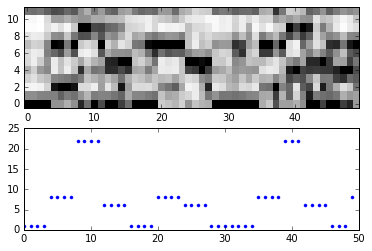

In [6]:
# Plot the chroma matrix "spectrogram-style", and show how the labels 
# line up.
plt.subplot(211)
my_imshow(chroma_features[:50, :].transpose())
plt.subplot(212)
plt.plot(label_indices[:50], '.')

In [7]:
# Resynthesize chroma feature matrices to audio with Shepard tones.
sr = 16000
y = mir_eval.sonify.chroma(chroma_features.transpose(), beat_times, sr)
IPython.display.Audio(data=y, rate=sr)

In [8]:
def load_all_features_labels(train_ids):
    """Load all the features and labels from a lit into big arrays."""
    features = []
    labels = []
    for train_id in train_ids:
        beat_times, chroma, label = read_beat_chroma_labels(train_id)
        assert not np.any(np.isnan(chroma))
        features.append(chroma)
        labels.append(label)
    features = np.concatenate(features)
    labels = np.concatenate(labels)
    print('Training features shape:', features.shape)
    return features, labels

def estimate_transitions(labels, num_models):
    # Count the number of transitions in the label set.
    # Each element of gtt is a 4 digit number indicating one transition 
    # e.g. 2400 for 24 -> 0.
    hashed_transitions = 100*labels[:-1] + labels[1:]
    # Arrange these into the transition matrix by counting each type.
    transitions = np.zeros((num_models, num_models))
    for i in xrange(num_models):
        for j in xrange(num_models):
            transition_hash = 100 * i + j 
            # Add one to all counts, so no transitions have zero 
            # probability.
            transitions[i, j] = 1 + np.count_nonzero(hashed_transitions == 
                                                     transition_hash)
    # Priors of each chord = total count of pairs starting in that chord.
    priors = np.sum(transitions, axis=1)
    # Normalize each row of transitions.
    transitions /= priors[:, np.newaxis]
    # Normalize priors too.
    priors /= np.sum(priors)
    return transitions, priors

def train_chord_models(train_ids):
    """Train Gaussian models for all chord data from a list of IDs.
    
    Args:
      train_ids:  List of IDs to pass to read_beat_chroma_labels().

    Returns:
      models: a list of sklearn.mixture.GMM objects, one for each class.
      transitions: np.array of size (num_classes, num_classes). 
        transitions[i, j] is the probability of moving to state j when 
        starting in state i.
      priors: 1D np.array giving the prior probability for each class.

    2016-04-03, 2010-04-07 Dan Ellis dpwe@ee.columbia.edu
    """
    features, labels = load_all_features_labels(train_ids)
    num_chroma = 12
    # We have a major and a minor chord model for each chroma, plus NOCHORD.
    num_models = 2 * num_chroma + 1
    # Global mean/covariance used for empty models.
    global_model = sklearn.mixture.GMM(n_components=1, 
                                       covariance_type='full')
    # Train a background model on all the data, regardless of label.
    global_model.fit(features)
    # Set up individual models for all chords.
    models = []
    for model_index in xrange(num_models):
        # labels contains one value in the range 0..24 for each row of 
        # features.
        true_example_rows = np.nonzero(labels == model_index)
        if true_example_rows:
            model = sklearn.mixture.GMM(n_components=1, 
                                        covariance_type='full')
            model.fit(features[true_example_rows])
            models.append(model)
        else:
            # No training data for this label, so substitute the 
            # background model.
            models.append(global_model)
    
    transitions, priors = estimate_transitions(labels, num_models)
    
    return models, transitions, priors

Training features shape: (65013, 12)


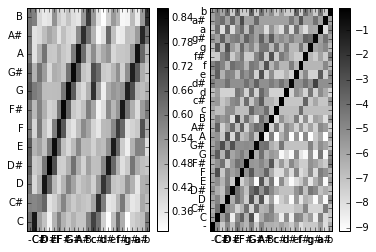

In [9]:
# Run the full set of training examples through the model training.
models, transitions, priors = train_chord_models(train_ids)
# Extract the means from each class's model to illustrate.
model_means = np.concatenate([model.means_ for model in models])
# Construct a list of names for each of the 25 classes.
all_chords = ['-', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 
              'B', 'c', 'c#', 'd', 'd#', 'e', 'f', 'f#', 'g', 'g#', 'a', 'a#', 'b']

plt.subplot(121)
my_imshow(model_means.transpose())
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(12), all_chords[1:13])
plt.subplot(122)
my_imshow(np.log(transitions))
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.colorbar()

In [10]:
def viterbi_path(posteriors, transitions, priors):
    """Calculate Viterbi (best-cost) path through Markov model.
    
    Args:
      posteriors: np.array sized (num_frames, num_states) giving the 
        local-match posterior probability of being in state j at time i.
      transitions: np.array of (num_states, num_states).  For each row, 
        transitions(row, col) gives the probability of transitioning from
        state row to state col.
      priors: np.array of (num_states,) giving prior probability of 
        each state.    
    """
    num_frames, num_states = posteriors.shape
    traceback = np.zeros((num_frames, num_states), dtype=int)
    # Normalized best probability-to-date for each state.
    best_prob = priors * posteriors[0]
    best_prob /= np.sum(best_prob)
    for frame in xrange(1, num_frames):
        # Find most likely combination of previous prob-to-path, and 
        # transition.
        possible_transition_scores = (transitions * 
                                      np.outer(best_prob, posteriors[frame]))
        # The max is found for each destination state (column), so the max
        # is over all the possible preceding states (rows).
        traceback[frame] = np.argmax(possible_transition_scores, axis=0)
        best_prob = np.max(possible_transition_scores, axis=0)
        best_prob /= np.sum(best_prob)
    # Traceback from best final state to get best path.
    path = np.zeros(num_frames, dtype=int)
    path[-1] = np.argmax(best_prob)
    for frame in xrange(num_frames - 1, 0, -1):
        path[frame - 1] = traceback[frame, path[frame]]
    return path

def recognize_chords(chroma, models, transitions, priors):
    """Perform chord recognition on chroma feature matrix."""
    scores = np.array([model.score(chroma) for model in models])
    chords = viterbi_path(np.exp(scores.transpose()), transitions, priors)
    return chords, scores

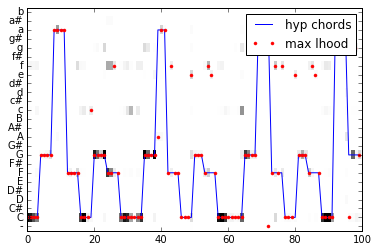

In [11]:
# Run chord recognition and plot best path over likelihoods for one track.
hyp_chords, scores = recognize_chords(chroma_features, models, transitions, priors)
max_time = 100
my_imshow(np.exp(scores[:, :max_time]), clim=[0, np.max(np.exp(scores))/4])
plt.plot(hyp_chords[:max_time], label='hyp chords')
plt.yticks(np.arange(25), all_chords)
# Compare to most-likely chord at each time.
most_likely = np.argmax(scores, axis=0)
plt.plot(most_likely[:max_time], '.r', label='max lhood')
plt.xlim(0, max_time)
plt.legend()

In [12]:
# We read the true labels when we read in the features.
true_chords = label_indices
print("true_chords shape:", true_chords.shape)
print("hyp_chords correct: {:.1f}%".format(100 * np.mean(true_chords == 
                                                         hyp_chords)))
print("max lhood chords correct: {:.1f}%".format(100 * np.mean(true_chords == 
                                                               most_likely)))

true_chords shape: (550,)
hyp_chords correct: 86.7%
max lhood chords correct: 68.2%


Chords correct: 86.7%


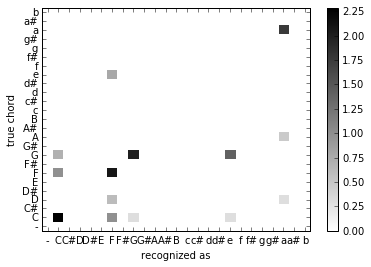

In [13]:
# Helper function to score one track.
def score_chord_recognition(hyp_chords, true_chords):
    """Calculate confusion matrix and return accuracy."""
    num_labels = 25
    confusions = sklearn.metrics.confusion_matrix(hyp_chords, true_chords, 
                                                  labels=np.arange(num_labels))
    score = np.sum(np.diag(confusions)) / float(np.sum(confusions))
    return score, confusions

score, confusions = score_chord_recognition(hyp_chords, true_chords)
print("Chords correct: {:.1f}%".format(100 * score))

my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')

In [14]:
def labels_to_chroma(labels):
    """Generate canonical chroma patterns from chord labels."""
    num_labels= len(labels)
    num_chroma = 12
    chroma = np.zeros((num_labels, num_chroma))
    for frame, label in enumerate(labels):
        if label > 12:
            # minor chord.
            chroma[frame, np.mod(np.array([0, 3, 7]) + (label - 13), 12)] = 1
        elif label > 0:
            # major chord.
            chroma[frame, np.mod(np.array([0, 4, 7]) + (label - 1), 12)] = 1
    return chroma

# Sonify the canonical chords corresponding to the system output.
y = mir_eval.sonify.chroma(labels_to_chroma(hyp_chords).transpose(), beat_times, sr)
IPython.display.Audio(data=y, rate=sr)

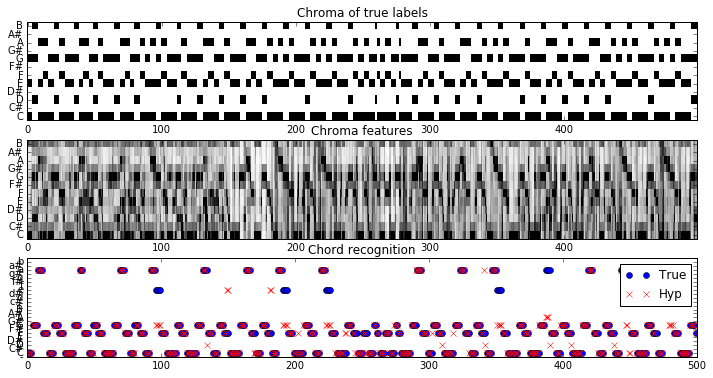

In [15]:
# Compare ideal chroma, actual chroma, and recognized and true chord labels.
max_time = 500
plt.figure(figsize=(12,6))
plt.subplot(311)
my_imshow(labels_to_chroma(true_chords[:max_time]).transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.title('Chroma of true labels')
plt.subplot(312)
my_imshow(chroma_features[:max_time].transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.title('Chroma features')
plt.subplot(313)
plt.plot(true_chords[:max_time], 'ob', label='True')
plt.plot(hyp_chords[:max_time], 'xr', label='Hyp')
plt.yticks(np.arange(25), all_chords)
plt.legend()
plt.title('Chord recognition')

Overall recognition accuracy = 69.5%


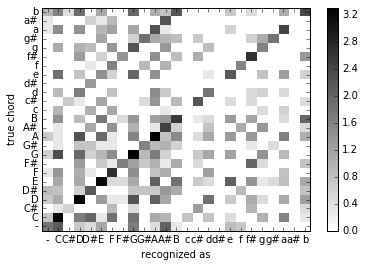

In [16]:
# Evaluate over a whole test set.
def test_chord_models(test_files, models, transitions, priors):
    """"Test chord recognizer on multiple tracks."""
    # Total # labels = Total # models = {major,minor} x {all chroma} + NOCHORD.
    num_chroma = 12
    num_labels = 2 * num_chroma + 1
    NOCHORD = 0
    # Initialize confusion matrix.
    all_confusions = np.zeros((num_labels, num_labels))
    # Run recognition on each file individually.
    for file_id in test_files:
        _, chroma, true_labels = read_beat_chroma_labels(file_id)
        hyp_labels, _ = recognize_chords(chroma, models, transitions, 
                                         priors)
        score, confusions = score_chord_recognition(hyp_labels, 
                                                    true_labels)
        all_confusions += confusions
    # Exclude regions where both streams report No Chord (e.g. lead
    # in/lead out)
    true_nothing_count = all_confusions[NOCHORD, NOCHORD]
    all_score = ((np.sum(np.diag(all_confusions)) - true_nothing_count) / 
                 (np.sum(all_confusions) - true_nothing_count))
    print('Overall recognition accuracy = {:.1f}%'.format(100 * all_score))
    return all_score, all_confusions

# Evaluate chord recognition over the entire test set.
score, confusions = test_chord_models(test_ids, models, transitions, priors)
# librosa chroma_cqt: 69.5%

# Plot overall confusion matrix.
my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')